In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split
from matplotlib.pyplot import imread
import matplotlib.pyplot as plt
import cv2

In [ ]:
import gdown
import zipfile

url = 'https://drive.google.com/u/0/uc?id=1QM6ob3qFj9otuAP_aY46uRV4nHKGQkCe'

output = 'Dataset-Dog.zip'

gdown.download(url, output, quiet=False)

with zipfile.ZipFile(output, 'r') as zip_ref:
    zip_ref.extractall('Dataset-Dog')

Downloading...
From: https://drive.google.com/u/0/uc?id=1QM6ob3qFj9otuAP_aY46uRV4nHKGQkCe
To: /content/Dataset-Dog.zip
100%|██████████| 647M/647M [00:14<00:00, 45.4MB/s]


In [ ]:
import os
import pandas as pd
import numpy as np
train_dir = 'Dataset-Dog/Dataset-Dog/train'
test_dir= 'Dataset-Dog/Dataset-Dog/test'

train_images_count = len(os.listdir(train_dir))
test_images_count = len(os.listdir(test_dir))

print(f"Train Count: {train_images_count}")
print(f"Test Count: {test_images_count}")

Train Count: 8134
Test Count: 10357


In [ ]:
labels_csv = pd.read_csv('Dataset-Dog/Dataset-Dog/labels.csv')

labels_csv


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever
...,...,...
10217,ffd25009d635cfd16e793503ac5edef0,borzoi
10218,ffd3f636f7f379c51ba3648a9ff8254f,dandie_dinmont
10219,ffe2ca6c940cddfee68fa3cc6c63213f,airedale
10220,ffe5f6d8e2bff356e9482a80a6e29aac,miniature_pinscher


In [ ]:
submission_df = pd.read_csv('Dataset-Dog/Dataset-Dog/sample_submission.csv')
submission_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,000621fb3cbb32d8935728e48679680e,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,...,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333
1,00102ee9d8eb90812350685311fe5890,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,...,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333
2,0012a730dfa437f5f3613fb75efcd4ce,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,...,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333
3,001510bc8570bbeee98c8d80c8a95ec1,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,...,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333
4,001a5f3114548acdefa3d4da05474c2e,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,...,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10352,ffeda8623d4eee33c6d1156a2ecbfcf8,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,...,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333
10353,fff1ec9e6e413275984966f745a313b0,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,...,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333
10354,fff74b59b758bbbf13a5793182a9bbe4,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,...,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333
10355,fff7d50d848e8014ac1e9172dc6762a3,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,...,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333


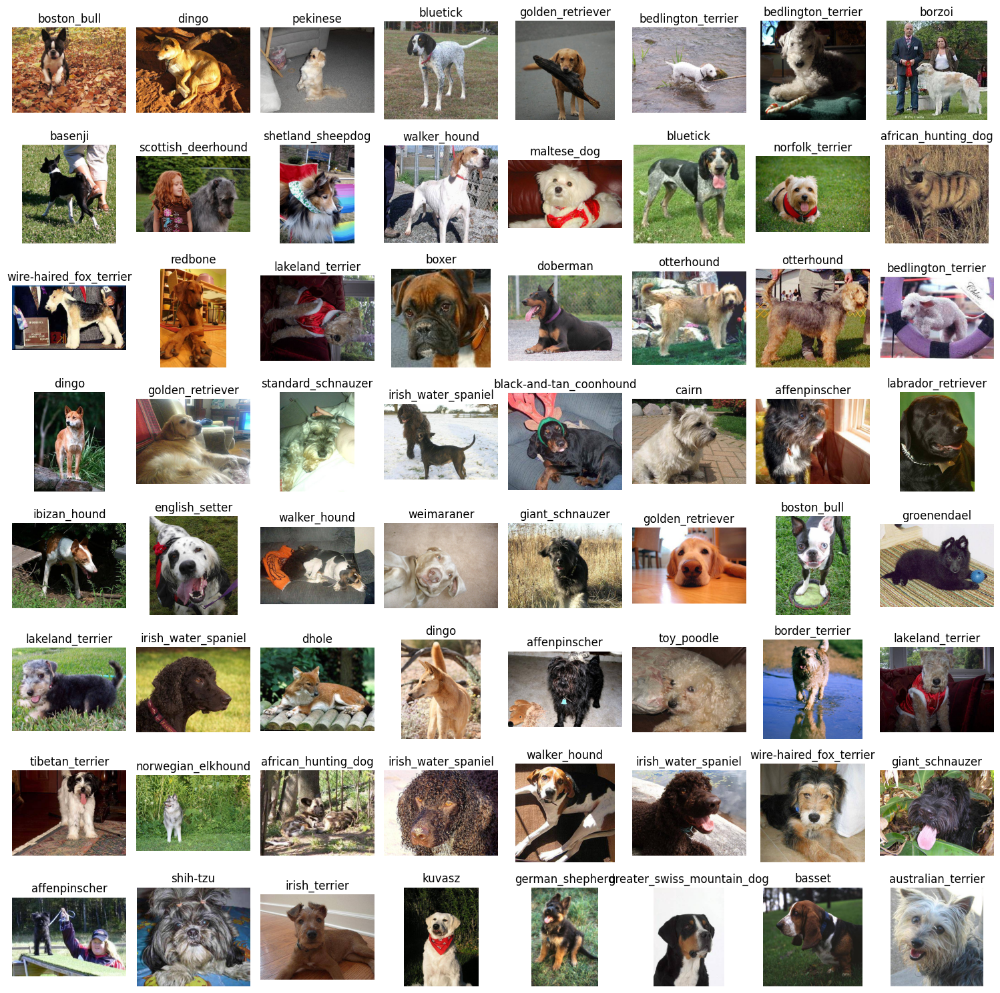

In [ ]:
nrow = 8
ncol = 8
fig, ax = plt.subplots(nrow, ncol, figsize=(15, 15))

for i, (img_id, breed) in enumerate(labels_csv[["id", "breed"]].values[:nrow * ncol]):
    image_id = os.path.splitext(img_id)[0]  # Extract the image ID
    image_path = os.path.join(train_dir, image_id + ".jpg")  # Form the image path
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    row = i // ncol
    col = i % ncol
    ax[row, col].imshow(image)
    ax[row, col].set_title(breed)
    ax[row, col].axis("off")

plt.tight_layout()
plt.show()

In [ ]:
print("Unique Dog Breeds :",len(labels_csv.breed.unique()))
num_classes = len(labels_csv.breed.unique())
img_height = 244
img_width = 244

Unique Dog Breeds : 120


In [ ]:
import tensorflow as tf
import tensorflow_hub as hub

# Load MobileNetV2 without top classification layer
mobilenet_v2_url = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"
mobilenet_v2_feature_extractor = hub.KerasLayer(mobilenet_v2_url, input_shape=(224, 224, 3), trainable=False)

# Create the model
model = tf.keras.Sequential([
    mobilenet_v2_feature_extractor,  # MobileNetV2 feature extractor
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(units=num_classes, activation='softmax')  # Replace num_classes with the number of classes
])

# Compile the model with an appropriate loss and optimizer
model.compile(optimizer='adam',
              loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

model.summary()


In [ ]:
if os.path.exists(train_dir):
    print(f"Train image directory exists: {train_dir}")
else:
    print(f"Train image directory does not exist: {train_dir}")

if os.path.exists(test_dir):
    print(f"Test image directory exists: {test_dir}")
else:
    print(f"Test image directory does not exist: {test_dir}")

In [ ]:
print(labels_csv.head())

                                     id             breed
0  000bec180eb18c7604dcecc8fe0dba07.jpg       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97.jpg             dingo
2  001cdf01b096e06d78e9e5112d419397.jpg          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d.jpg          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62.jpg  golden_retriever


In [ ]:
# Train the model
labels_csv['id'] = labels_csv['id'].str.replace('.jpg', '', regex=False)
labels_csv['id'] = labels_csv['id'] + '.jpg'
batch_size = 16
experiment_logs = []
X_train, X_val, y_train, y_val = train_test_split(
    labels_csv['id'],  # Use the 'id' column for the filenames
    labels_csv['breed'],  # Use the 'breed' column for the labels
    test_size=0.2,  # Adjust the test size as needed
    random_state=42  # Set a random seed for reproducibility
)
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1.0 / 255.0,
    validation_split=0.2,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)
# train_datagen data augmentation

img_height, img_width = 224, 224  # Set the desired image size

train_generator = train_datagen.flow_from_dataframe(
    labels_csv,
    directory=train_dir,  # Replace with the path to your image directory
    x_col="id",
    y_col="breed",
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode="categorical"
)

validation_generator = train_datagen.flow_from_dataframe(
    labels_csv,
    directory=train_dir,  # Replace with the path to your image directory
    x_col="id",
    y_col="breed",
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode="categorical",
    subset='validation'  # This specifies the validation subset
)



# Log the original model's performance
original_history = model.fit(
    train_generator,
    steps_per_epoch=len(train_generator),
    validation_data=validation_generator,
    validation_steps=len(validation_generator),
    epochs=2  # Adjust the number of epochs as needed
)


original_val_loss, original_val_accuracy = model.evaluate(validation_generator)
experiment_logs.append({
    "Parameters": "Original Model",
    "Number of Layers": 1,
    "Filter Size Layer 1": 128,
    "Activation Function": "relu",
    "Epochs": 1,  # Add the number of epochs parameter
    "Training Accuracy": original_history.history['accuracy'][-1],
    "Training Loss": original_history.history['loss'][-1],
    "Validation Accuracy": original_val_accuracy,
    "Validation Loss": original_val_loss,
})



Found 8134 validated image filenames belonging to 120 classes.
Found 1626 validated image filenames belonging to 120 classes.


/usr/local/lib/python3.10/dist-packages/keras/src/preprocessing/image.py:1137: UserWarning: Found 2088 invalid image filename(s) in x_col="id". These filename(s) will be ignored.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/keras/src/preprocessing/image.py:1137: UserWarning: Found 2088 invalid image filename(s) in x_col="id". These filename(s) will be ignored.
  warnings.warn(


Epoch 1/2
509/509 [==============================] - 149s 293ms/step - loss: 0.4467 - accuracy: 0.8546 - val_loss: 0.3716 - val_accuracy: 0.8727
Epoch 2/2
102/102 [==============================] - 24s 234ms/step - loss: 0.3131 - accuracy: 0.8985


In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 flatten (Flatten)           (None, 1001)              0         
                                                                 
 dense (Dense)               (None, 128)               128256    
                                                                 
 dense_1 (Dense)             (None, 120)               15480     
                                                                 
Total params: 5576449 (21.27 MB)
Trainable params: 143736 (561.47 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [ ]:
model.save("OG_model.h5")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
experiments = []

# Define a parameter grid for tuning
param_grid = [
    {"Number of layers": 3, "Filter Size Layer 1": 128, "Activation Function": "relu", "Epochs": 2},
    {"Number of layers": 10, "Filter Size Layer 1": 256, "Activation Function": "relu", "Epochs": 2},
    {"Number of layers": 3, "Filter Size Layer 1": 128, "Activation Function": "sigmoid", "Epochs": 2},
    {"Number of layers": 10, "Filter Size Layer 1": 256, "Activation Function": "sigmoid", "Epochs": 2},
]
# Iterate through the parameter grid and perform experiments
for params in param_grid:
    num_layers = params["Number of layers"]
    filter_size_layer1 = params["Filter Size Layer 1"]
    activation_function = params["Activation Function"]
    epochs = params["Epochs"]
    tf.keras.layers.Dense(filter_size_layer1, activation=activation_function)
    # adding layers
    for layers in range(int(num_layers)-1):
      tf.keras.layers.Dense(1, activation=activation_function)

    # Create a model with the specified hyperparameters
    experiment_model = tf.keras.Sequential([
        mobilenet_v2_feature_extractor,
        tf.keras.layers.Flatten(),
      tf.keras.layers.Dense(units=num_classes, activation='softmax')
    ])


    #tf.keras.layers.Dense(units=num_classes, activation='softmax')
    # Compile the model with an appropriate loss and optimizer
    experiment_model.compile(optimizer='adam',
                             loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
                             metrics=['accuracy'])

    # Train the model
    experiment_history = experiment_model.fit(
        train_generator,
        steps_per_epoch=len(train_generator),
        validation_data=validation_generator,
        validation_steps=len(validation_generator),
        epochs=epochs  # Use the specified number of epochs
    )

    experiment_val_loss, experiment_val_accuracy = experiment_model.evaluate(validation_generator)

    # Log the experiment results
    experiment_logs.append({
        "Parameters": params,
        "Number of Layers": num_layers,
        "Filter Size Layer 1": filter_size_layer1,
        "Activation Function": activation_function,
        "Epochs": epochs,
        "Training Accuracy": experiment_history.history['accuracy'][-1],
        "Training Loss": experiment_history.history['loss'][-1],
        "Validation Accuracy": experiment_val_accuracy,
        "Validation Loss": experiment_val_loss,
    })

Epoch 1/2


/usr/local/lib/python3.10/dist-packages/keras/src/backend.py:5577: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


509/509 [==============================] - 167s 325ms/step - loss: 1.7430 - accuracy: 0.5652 - val_loss: 0.7454 - val_accuracy: 0.7829
Epoch 2/2
102/102 [==============================] - 24s 236ms/step - loss: 0.5822 - accuracy: 0.8198
Epoch 1/2
509/509 [==============================] - 222s 292ms/step - loss: 1.7293 - accuracy: 0.5751 - val_loss: 0.7737 - val_accuracy: 0.7645
Epoch 2/2
102/102 [==============================] - 24s 234ms/step - loss: 0.5579 - accuracy: 0.8241
Epoch 1/2
509/509 [==============================] - 147s 285ms/step - loss: 1.7710 - accuracy: 0.5625 - val_loss: 0.7338 - val_accuracy: 0.7847
Epoch 2/2
102/102 [==============================] - 24s 234ms/step - loss: 0.5973 - accuracy: 0.8167
Epoch 1/2
509/509 [==============================] - 154s 298ms/step - loss: 1.7410 - accuracy: 0.5711 - val_loss: 0.7048 - val_accuracy: 0.7903
Epoch 2/2
102/102 [==============================] - 25s 240ms/step - loss: 0.6093 - accuracy: 0.8063


In [ ]:
experiment_model.save("Tuning_model.h5")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
# Create a DataFrame from the experiment logs
experiment_logs_df = pd.DataFrame(experiment_logs)



In [ ]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', 1000)
pd.set_option('display.max_columns', 1000)



experiment_logs_df

,Parameters,Number of Layers,Filter Size Layer 1,Activation Function,Epochs,Training Accuracy,Training Loss,Validation Accuracy,Validation Loss
0,Original Model,1,128,relu,1,0.852717,0.442502,0.898524,0.313068
1,"{'Number of layers': 3, 'Filter Size Layer 1': 128, 'Activation Function': 'relu', 'Epochs': 2}",3,128,relu,2,0.762601,0.800146,0.819803,0.582191
2,"{'Number of layers': 10, 'Filter Size Layer 1': 256, 'Activation Function': 'relu', 'Epochs': 2}",10,256,relu,2,0.758176,0.806815,0.824108,0.557872
3,"{'Number of layers': 3, 'Filter Size Layer 1': 128, 'Activation Function': 'sigmoid', 'Epochs': 2}",3,128,sigmoid,2,0.762110,0.801980,0.816728,0.597278
4,"{'Number of layers': 10, 'Filter Size Layer 1': 256, 'Activation Function': 'sigmoid', 'Epochs': 2}",10,256,sigmoid,2,0.761618,0.800504,0.806273,0.609294


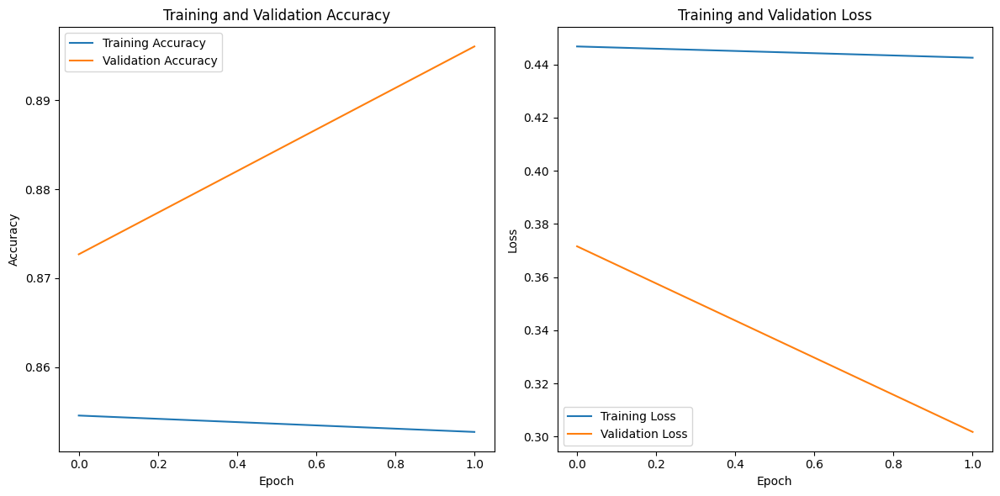

In [ ]:
import matplotlib.pyplot as plt

# Plot training and validation accuracy and loss
plt.figure(figsize=(12, 6))

# Training Accuracy
plt.subplot(1, 2, 1)
plt.plot(original_history.history['accuracy'], label='Training Accuracy')
plt.plot(original_history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Training Loss
plt.subplot(1, 2, 2)
plt.plot(original_history.history['loss'], label='Training Loss')
plt.plot(original_history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()


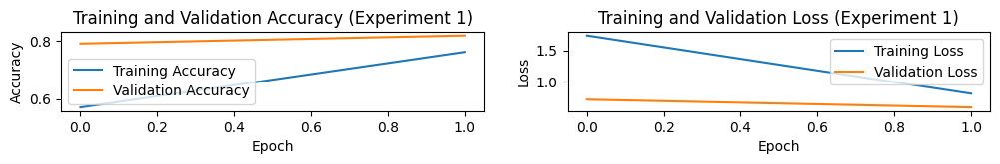

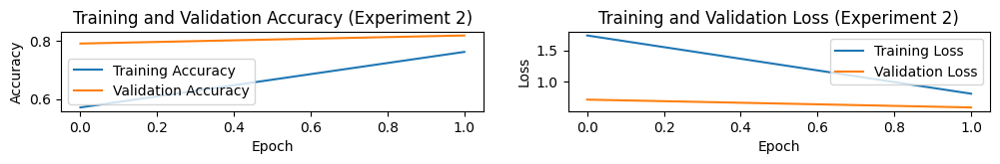

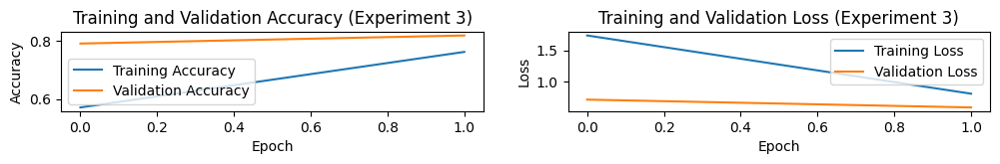

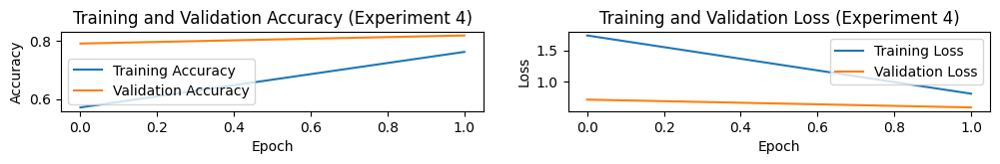

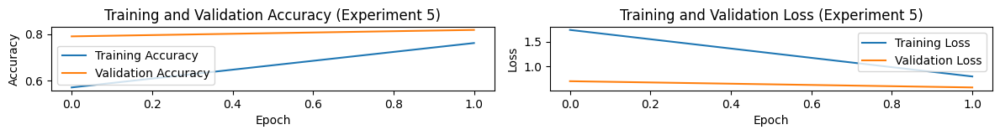

In [ ]:
import matplotlib.pyplot as plt

# Create subplots for training and validation accuracy and loss
num_experiments = len(experiment_logs)

for i, experiment in enumerate(experiment_logs):


    plt.figure(figsize=(12, 6))

    # Training Accuracy
    plt.subplot(num_experiments, 2, i * 2 + 1)
    plt.plot(experiment_history.history['accuracy'], label='Training Accuracy')
    plt.plot(experiment_history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Training and Validation Accuracy (Experiment {})'.format(i + 1))
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    # Training Loss
    plt.subplot(num_experiments, 2, i * 2 + 2)
    plt.plot(experiment_history.history['loss'], label='Training Loss')
    plt.plot(experiment_history.history['val_loss'], label='Validation Loss')
    plt.title('Training and Validation Loss (Experiment {})'.format(i + 1))
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

plt.tight_layout()
plt.show()


1/1 [==============================] - 0s 22ms/step


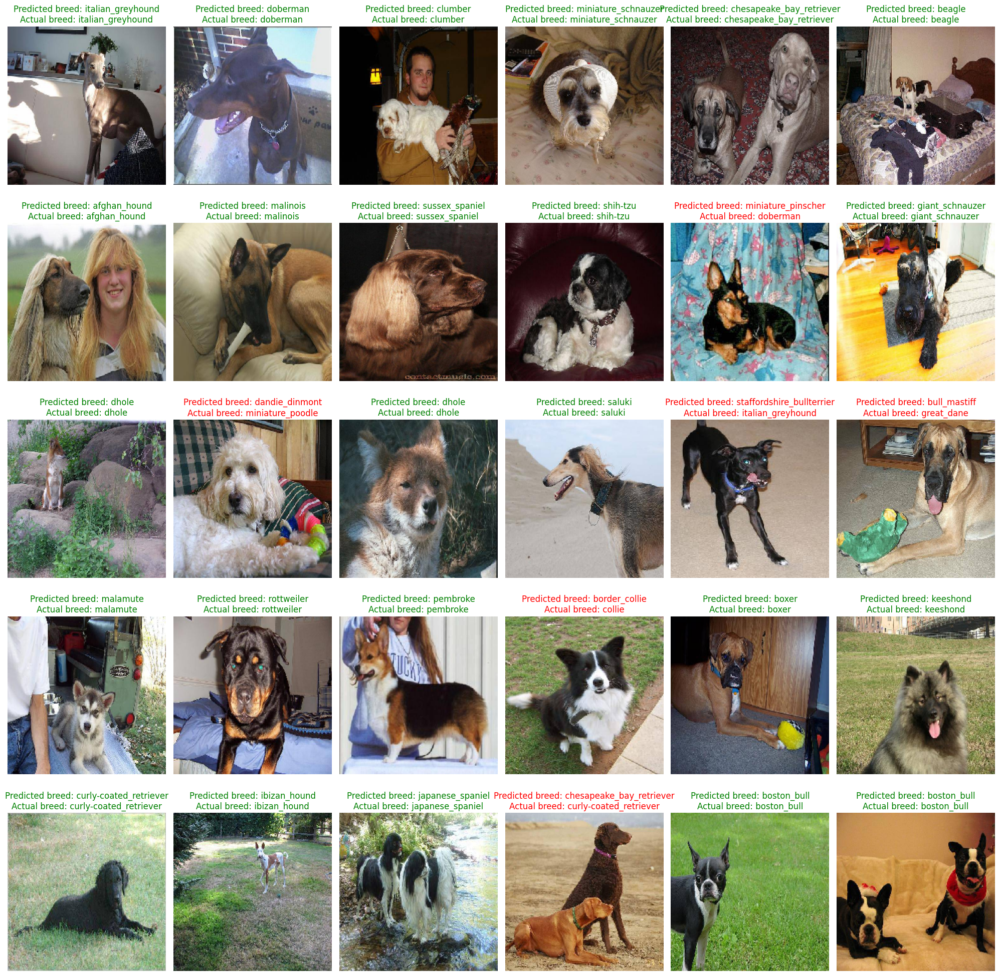

Number of incorrect predictions: 6


In [ ]:
# Create a 5x6 grid for displaying images (30 images) using the Tuned model
fig, axes = plt.subplots(5, 6, figsize=(20, 20))
axes = axes.ravel()  # Flatten the 5x10 grid to 1D

incorrect_predictions = 0  # Counter for incorrect predictions
sample_test_images = os.listdir(train_dir)[:30]
for i, image_file in enumerate(sample_test_images):
    image_id = image_file.split('.')[0]  # Extract the image ID from the file name
    image_path = os.path.join(train_dir, image_file)

    # Load and preprocess the image using Keras preprocessing functions
    image = tf.keras.preprocessing.image.load_img(image_path, target_size=(224, 224))
    image_array = tf.keras.preprocessing.image.img_to_array(image)
    image_array = image_array / 255.0
    image_array = np.expand_dims(image_array, axis=0)

    predictions = experiment_model.predict(image_array)
    predicted_breed = np.argmax(predictions)
    predicted_breed_name = list(train_generator.class_indices.keys())[predicted_breed]

    # Check if the image_id exists in labels_df
    if not labels_csv['id'].str.contains(image_id + '.jpg').any():
        print(f"ID {image_id + '.jpg'} not found in labels_df")
        continue

    # Find the actual breed from the dataset
    actual_breed = labels_csv.loc[labels_csv['id'] == image_id + '.jpg', 'breed'].values[0]

    # Display the image with predicted and actual breed
    axes[i].imshow(image)
    if predicted_breed_name != actual_breed:
        axes[i].set_title(f"Predicted breed: {predicted_breed_name}\nActual breed: {actual_breed}", color='red')
        incorrect_predictions += 1
    else:
        axes[i].set_title(f"Predicted breed: {predicted_breed_name}\nActual breed: {actual_breed}", color='green')
    axes[i].axis('off')

plt.tight_layout()
plt.show()

print(f"Number of incorrect predictions: {incorrect_predictions}")


1/1 [==============================] - 0s 25ms/step


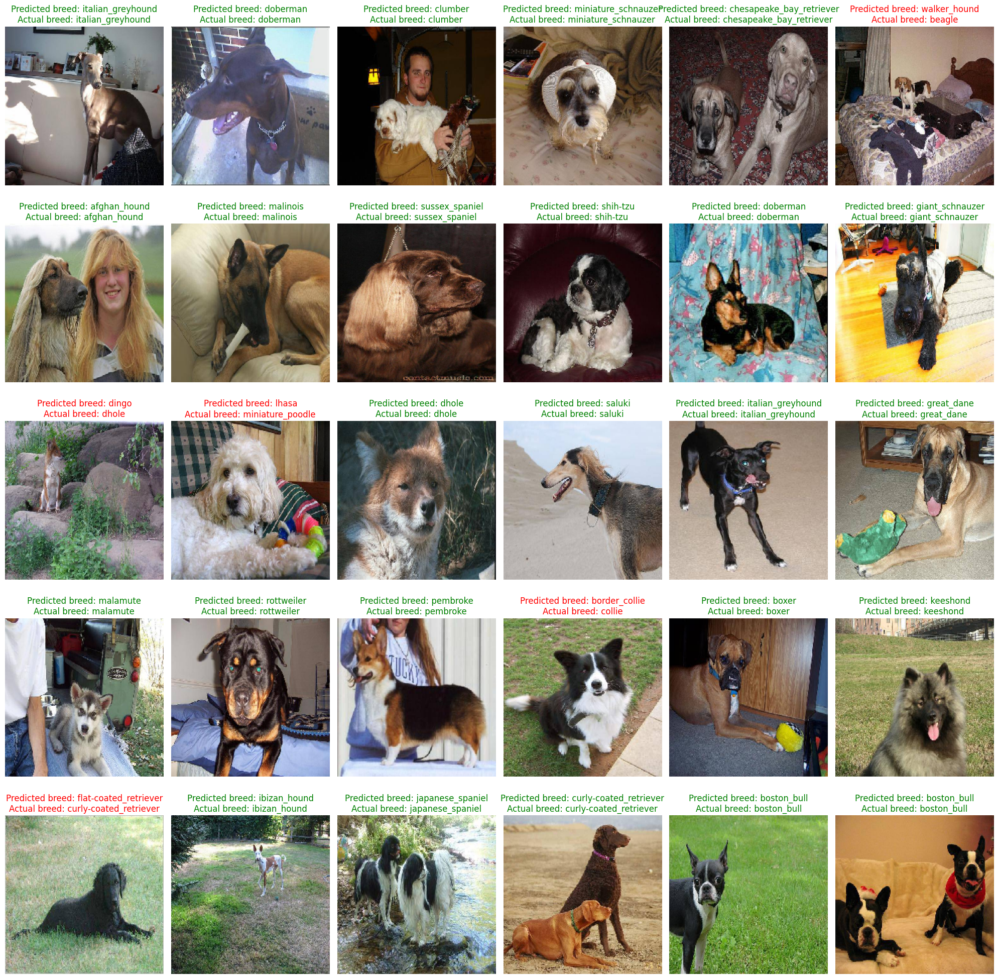

Number of incorrect predictions: 5


In [ ]:
# Create a 5x6 grid for displaying images (30 images) using Best model (Concluded using table)
fig, axes = plt.subplots(5, 6, figsize=(20, 20))
axes = axes.ravel()  # Flatten the 5x10 grid to 1D

incorrect_predictions = 0  # Counter for incorrect predictions
sample_test_images = os.listdir(train_dir)[:30]
for i, image_file in enumerate(sample_test_images):
    image_id = image_file.split('.')[0]  # Extract the image ID from the file name
    image_path = os.path.join(train_dir, image_file)

    # Load and preprocess the image using Keras preprocessing functions
    image = tf.keras.preprocessing.image.load_img(image_path, target_size=(224, 224))
    image_array = tf.keras.preprocessing.image.img_to_array(image)
    image_array = image_array / 255.0
    image_array = np.expand_dims(image_array, axis=0)

    predictions = model.predict(image_array)
    predicted_breed = np.argmax(predictions)
    predicted_breed_name = list(train_generator.class_indices.keys())[predicted_breed]

    # Check if the image_id exists in labels_df
    if not labels_csv['id'].str.contains(image_id + '.jpg').any():
        print(f"ID {image_id + '.jpg'} not found in labels_df")
        continue

    # Find the actual breed from the dataset
    actual_breed = labels_csv.loc[labels_csv['id'] == image_id + '.jpg', 'breed'].values[0]

    # Display the image with predicted and actual breed
    axes[i].imshow(image)
    if predicted_breed_name != actual_breed:
        axes[i].set_title(f"Predicted breed: {predicted_breed_name}\nActual breed: {actual_breed}", color='red')
        incorrect_predictions += 1
    else:
        axes[i].set_title(f"Predicted breed: {predicted_breed_name}\nActual breed: {actual_breed}", color='green')
    axes[i].axis('off')

plt.tight_layout()
plt.show()

print(f"Number of incorrect predictions: {incorrect_predictions}")
